In [37]:
# ! pip install seaborn 

#! pip install lightgbm

Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


In [39]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.simplefilter('ignore')
import gc
%matplotlib inline
from plotly import tools, subplots
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.express as px
pd.set_option('max_columns', 100)
import lightgbm as lgb

from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder

# Loading Datasets

In [4]:
building_data = pd.read_csv('building_metadata.csv')
weather_train = pd.read_csv('weather_train.csv')
weather_test = pd.read_csv('weather_test.csv')
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

# Count and info of rows and Columns in dataset

In [14]:
print(building_data.head(5))
# print(building_data.tail(5))
print(building_data.info())

   site_id  building_id primary_use  square_feet  year_built  floor_count
0        0            0   Education         7432      2008.0          NaN
1        0            1   Education         2720      2004.0          NaN
2        0            2   Education         5376      1991.0          NaN
3        0            3   Education        23685      2002.0          NaN
4        0            4   Education       116607      1975.0          NaN
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1449 entries, 0 to 1448
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   site_id      1449 non-null   int64  
 1   building_id  1449 non-null   int64  
 2   primary_use  1449 non-null   object 
 3   square_feet  1449 non-null   int64  
 4   year_built   675 non-null    float64
 5   floor_count  355 non-null    float64
dtypes: float64(2), int64(3), object(1)
memory usage: 68.0+ KB
None


# label Encoding

In [23]:
le = LabelEncoder()
building_data.primary_use = le.fit_transform(building_data.primary_use)

In [15]:
print(weather_train.head(5))
# print(weather_train.tail(5))
print(weather_train.info())

   site_id            timestamp  air_temperature  cloud_coverage  \
0        0  2016-01-01 00:00:00             25.0             6.0   
1        0  2016-01-01 01:00:00             24.4             NaN   
2        0  2016-01-01 02:00:00             22.8             2.0   
3        0  2016-01-01 03:00:00             21.1             2.0   
4        0  2016-01-01 04:00:00             20.0             2.0   

   dew_temperature  precip_depth_1_hr  sea_level_pressure  wind_direction  \
0             20.0                NaN              1019.7             0.0   
1             21.1               -1.0              1020.2            70.0   
2             21.1                0.0              1020.2             0.0   
3             20.6                0.0              1020.1             0.0   
4             20.0               -1.0              1020.0           250.0   

   wind_speed  
0         0.0  
1         1.5  
2         0.0  
3         0.0  
4         2.6  
<class 'pandas.core.frame.DataFr

In [16]:
print(weather_test.head(5))
# print(weather_test.tail(5))
print(weather_test.info())

   site_id            timestamp  air_temperature  cloud_coverage  \
0        0  2017-01-01 00:00:00             17.8             4.0   
1        0  2017-01-01 01:00:00             17.8             2.0   
2        0  2017-01-01 02:00:00             16.1             0.0   
3        0  2017-01-01 03:00:00             17.2             0.0   
4        0  2017-01-01 04:00:00             16.7             2.0   

   dew_temperature  precip_depth_1_hr  sea_level_pressure  wind_direction  \
0             11.7                NaN              1021.4           100.0   
1             12.8                0.0              1022.0           130.0   
2             12.8                0.0              1021.9           140.0   
3             13.3                0.0              1022.2           140.0   
4             13.3                0.0              1022.3           130.0   

   wind_speed  
0         3.6  
1         3.1  
2         3.1  
3         3.1  
4         2.6  
<class 'pandas.core.frame.DataFr

# Train and Test description

In [17]:
train.describe(include='all')

,building_id,meter,timestamp,meter_reading
count,2.021610e+07,2.021610e+07,20216100,2.021610e+07
unique,NaN,NaN,8784,NaN
top,NaN,NaN,2016-12-27 22:00:00,NaN
freq,NaN,NaN,2370,NaN
mean,7.992780e+02,6.624412e-01,NaN,2.117121e+03
std,4.269133e+02,9.309921e-01,NaN,1.532356e+05
min,0.000000e+00,0.000000e+00,NaN,0.000000e+00
25%,3.930000e+02,0.000000e+00,NaN,1.830000e+01
50%,8.950000e+02,0.000000e+00,NaN,7.877500e+01
75%,1.179000e+03,1.000000e+00,NaN,2.679840e+02


In [21]:
train.columns

Index(['building_id', 'meter', 'timestamp', 'meter_reading'], dtype='object')

In [19]:
test.describe(include='all')

,row_id,building_id,meter,timestamp
count,4.169760e+07,4.169760e+07,4.169760e+07,41697600
unique,NaN,NaN,NaN,17520
top,NaN,NaN,NaN,2017-08-24 02:00:00
freq,NaN,NaN,NaN,2380
mean,2.084880e+07,8.075824e+02,6.642857e-01,NaN
std,1.203706e+07,4.297680e+02,9.278067e-01,NaN
min,0.000000e+00,0.000000e+00,0.000000e+00,NaN
25%,1.042440e+07,4.047500e+02,0.000000e+00,NaN
50%,2.084880e+07,9.000000e+02,0.000000e+00,NaN
75%,3.127320e+07,1.194250e+03,1.000000e+00,NaN


In [20]:
test.isnull().sum()

row_id         0
building_id    0
meter          0
timestamp      0
dtype: int64

# Merging building and weather data into test and train 

In [25]:
def prepare_data(X, building_data, weather_data, test=False):
    """
    Preparing final dataset with all features.
    """
    
    X = X.merge(building_data, on="building_id", how="left")
    X = X.merge(weather_data, on=["site_id", "timestamp"], how="left")
    
    X.timestamp = pd.to_datetime(X.timestamp, format="%Y-%m-%d %H:%M:%S")
    X.square_feet = np.log1p(X.square_feet)
    
    if not test:
        X.sort_values("timestamp", inplace=True)
        X.reset_index(drop=True, inplace=True)
    
    gc.collect()
    
    holidays = ["2016-01-01", "2016-01-18", "2016-02-15", "2016-05-30", "2016-07-04",
                "2016-09-05", "2016-10-10", "2016-11-11", "2016-11-24", "2016-12-26",
                "2017-01-01", "2017-01-16", "2017-02-20", "2017-05-29", "2017-07-04",
                "2017-09-04", "2017-10-09", "2017-11-10", "2017-11-23", "2017-12-25",
                "2018-01-01", "2018-01-15", "2018-02-19", "2018-05-28", "2018-07-04",
                "2018-09-03", "2018-10-08", "2018-11-12", "2018-11-22", "2018-12-25",
                "2019-01-01"]
    
    X["hour"] = X.timestamp.dt.hour
    X["weekday"] = X.timestamp.dt.weekday
    X["is_holiday"] = (X.timestamp.dt.date.astype("str").isin(holidays)).astype(int)
    
    drop_features = ["timestamp", "sea_level_pressure", "wind_direction", "wind_speed"]

    X.drop(drop_features, axis=1, inplace=True)

    if test:
        row_ids = X.row_id
        X.drop("row_id", axis=1, inplace=True)
        return X, row_ids
    else:
        y = np.log1p(X.meter_reading)
        X.drop("meter_reading", axis=1, inplace=True)
        return X, y

In [27]:
X_train, y_train = prepare_data(train, building_data, weather_train)

In [9]:
train = train.merge(building_data, on='building_id', how='left')
test = test.merge(building_data, on='building_id', how='left')

train = train.merge(weather_train, on=['site_id', 'timestamp'], how='left')
test = test.merge(weather_test, on=['site_id', 'timestamp'], how='left')

In [44]:
# int(X_train.shape[0]/2)

# X_train[:int(X_train.shape[0] / 2)]
# X_train[int(X_train.shape[0] / 2):]
categorical_features = ["building_id", "site_id", "meter", "primary_use", "hour", "weekday"]

data_trained = lgb.Dataset(X_train, label=y_train, categorical_feature=categorical_features, free_raw_data=False)

params = {}
params['learning_rate'] = 0.003
params['boosting_type'] = 'gbdt'
params['objective'] = 'binary'
params['metric'] = 'binary_logloss'
params['sub_feature'] = 0.5
params['num_leaves'] = 10
params['min_data'] = 50
params['max_depth'] = 10

# clf = lgb.train(params, d_train, 100)
model = lgb.train(params, train_set=data_trained, num_boost_round=1000)
#verbose_eval=200,


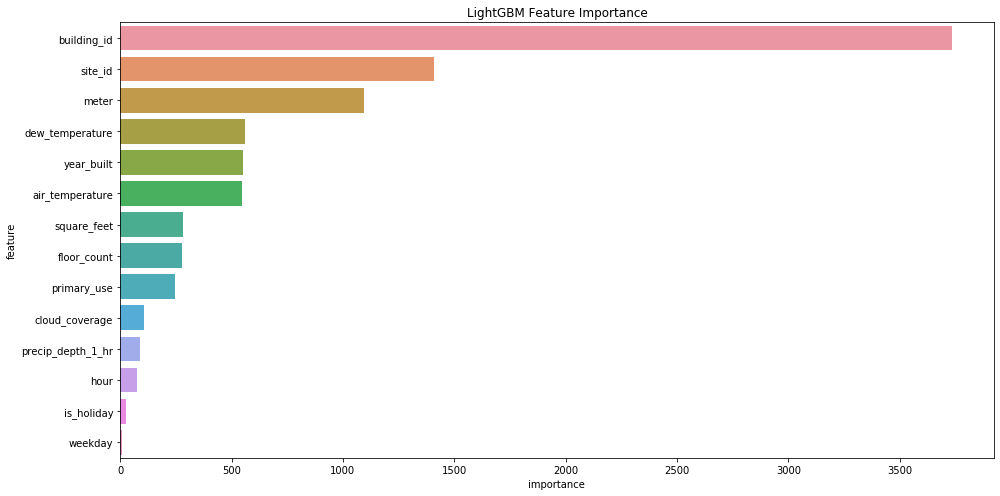

In [46]:
df_fimp = pd.DataFrame()
df_fimp["feature"] = X_train.columns.values
df_fimp["importance"] = model.feature_importance()


plt.figure(figsize=(14, 7))
sns.barplot(x="importance", y="feature", data=df_fimp.sort_values(by="importance", ascending=False))
plt.title("LightGBM Feature Importance")
plt.tight_layout()

# Preparing for test data

In [47]:
X_test, row_ids = prepare_data(test, building_data, weather_test, test=True)

# Scoring for the test data

In [48]:
pred = np.expm1(model.predict(X_test, num_iteration=model.best_iteration))

# Count of Data Missing in Train

In [10]:
for col in train.columns:
    if train[col].isna().sum()>0:
        print (col,train[col].isna().sum())

year_built 12127645
floor_count 16709167
air_temperature 96658
cloud_coverage 8825365
dew_temperature 100140
precip_depth_1_hr 3749023
sea_level_pressure 1231669
wind_direction 1449048
wind_speed 143676


# Count of Data Missing in test

In [13]:
for col in test.columns:
    if test[col].isna().sum()>0:
        print (col,test[col].isna().sum())

year_built 24598080
floor_count 34444320
air_temperature 221901
cloud_coverage 19542180
dew_temperature 260799
precip_depth_1_hr 7801563
sea_level_pressure 2516826
wind_direction 2978663
wind_speed 302089


In [13]:
train.columns

Index(['building_id', 'meter', 'timestamp', 'meter_reading'], dtype='object')

# Distribution plot for the target variable

In [33]:
from bokeh.layouts import gridplot
from bokeh.plotting import figure, show, output_file
from bokeh.io import output_notebook

output_notebook()

def make_plot(title, hist, edges, xlabel):
    p = figure(title=title, tools='', background_fill_color="#fafafa")
    p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:],
           fill_color="#1E90FF", line_color="white", alpha=0.5)
    p.y_range.start = 0
    p.xaxis.axis_label = f'Log of {xlabel} meter reading'
    p.yaxis.axis_label = 'Probability'
    p.grid.grid_line_color="white"
    return p

def scatter_plot(cnt_srs, color):
    trace = go.Scatter(
        x=cnt_srs.index[::-1],
        y=cnt_srs.values[::-1],
        showlegend=False,
        marker=dict(
            color=color,
        ),
    )
    return trace

Loading BokehJS ...

In [57]:
dataset = train[train["meter"]==0]
hist, edges = np.histogram(np.log1p(dataset["meter_reading"].values), density=True, bins=50)
p1 = make_plot("Meter Reading Distribution for Electricity meter", hist, edges, "electricity")

dataset = train[train["meter"]==1]
hist, edges = np.histogram(np.log1p(dataset["meter_reading"].values), density=True, bins=50)
p2 = make_plot("Meter Reading Distribution for Chilled Water meter", hist, edges, 'chill water')

dataset = train[train["meter"]==2]
hist, edges = np.histogram(np.log1p(dataset["meter_reading"].values), density=True, bins=50)
p3 = make_plot("Meter Reading Distribution for Steam meter", hist, edges, 'steam')

dataset = train[train["meter"]==3]
hist, edges = np.histogram(np.log1p(dataset["meter_reading"].values), density=True, bins=50)
p4 = make_plot("Meter Reading Distribution for Hot Water meter", hist, edges, 'hot water')

show(gridplot([p1,p2,p3,p4], ncols=2, plot_width=400, plot_height=400, toolbar_location=None))

###### Electricty meter type has the most number of rows 

# Distribution of target variable meter readings over a time period

In [66]:
dataset = train[train["building_id"]==1292].reset_index(drop=True)


tdf = dataset[dataset["meter"]==0]
col = tdf["meter_reading"]
col.index = tdf["timestamp"]
trace1 = scatter_plot(col, 'orange')

tdf = dataset[dataset["meter"]==1]
col = tdf["meter_reading"]
col.index = tdf["timestamp"]
trace2 = scatter_plot(col, 'blue')

tdf = dataset[dataset["meter"]==2]
col = tdf["meter_reading"]
col.index = tdf["timestamp"]
trace3 = scatter_plot(col, 'green')


subtitles = ["Meter reading over time for electricity meter for building 1292",
             "Meter reading over time for chill water meter for building 1292",
             "Meter reading over time for steam meter for building 1292",
            ]
fig = subplots.make_subplots(rows=3, cols=1, vertical_spacing=0.06,
                          subplot_titles=subtitles)
fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 2, 1)
fig.append_trace(trace3, 3, 1)
fig['layout'].update(height=1200, width=1000, paper_bgcolor='rgb(223,223,233)')
py.iplot(fig, filename='meter-plots')

###### The electricity meter readings are generally in the range of 60 to 400 but becomes 0 at times in between.
###### We can see an increase in the chill water meter from sep to octof 2016 for this building probably due to  summer time

# Distribution plots for Building

###### Energy consumption in building will if it is used for commerical purpose

In [58]:
data_index = building_data["primary_use"].value_counts()
#data_index = data_index.sort_index()
trace = go.Bar(
    x=data_index.index,
    y=data_index.values,
    marker=dict(
        color="#1E90FF",
    ),
)

layout = go.Layout(
    title=go.layout.Title(
        text="Distribution of primary use of Buildings",
        x=0.5
    ),
    font=dict(size=14),
    width=1000,
    height=500,
)

data = [trace]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename="meter")


###### Education is the one with most number of primary usage followed by office adn entertainment

#### Floor count in the building 

In [61]:
dataset = train["floor_count"].value_counts()

trace = go.Bar(
    x=dataset.index,
    y=dataset.values,
    marker=dict(
        color="#1E90FF",
    ),
)

layout = go.Layout(
    title=go.layout.Title(
        text="Distribution of floors in building",
        x=0.5
    ),
    font=dict(size=14),
    width=1000,
    height=500,
)

data = [trace]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename="meter")

# Distribution plots for Weather

###### Air temperature distribution 

In [63]:
fig = px.line(weather_train, x='timestamp', y='air_temperature', color='site_id')
fig.show()

###### Looking at the graph it seems that the temperature increases in all the sites towards the middle of the year and decreases at the end of year.